In [ ]:
# Exploratory Data Analysis (EDA) of Air Quality Data in India

## Problem Definition
Explore a dataset containing pollutant concentrations (PM2.5, PM10, NO2, SO2, CO, O3) across Indian cities and dates. This analysis will:
- Calculate descriptive statistics
- Handle missing values
- Generate correlation matrices
- Create interactive visualizations to identify pollution patterns and anomalies

## Learning Objectives
1. Perform comprehensive EDA with descriptive statistics
2. Handle data quality issues and missing values
3. Analyze correlations between pollutants
4. Interpret temporal and spatial pollution patterns

In [1]:
# Import Essential Libraries for EDA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

# Set style for matplotlib
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

print("Libraries imported successfully!")
print("Available for analysis: pandas, numpy, matplotlib, seaborn, plotly")

Libraries imported successfully!
Available for analysis: pandas, numpy, matplotlib, seaborn, plotly


In [2]:
# Load Air Quality Dataset
# Loading the actual AQI dataset from specified location
dataset_path = r"C:\Users\dipes\Desktop\5th Sem\ML\AQI Dataset\city_day.csv"

try:
    print("Loading Air Quality Dataset from:", dataset_path)
    df = pd.read_csv(dataset_path)
    print("✅ Dataset loaded successfully!")
    
    # Basic dataset information
    print(f"Dataset shape: {df.shape}")
    print(f"Columns: {list(df.columns)}")
    
    # Check if Date column exists and convert to datetime
    if 'Date' in df.columns:
        df['Date'] = pd.to_datetime(df['Date'])
        print(f"Date range: {df['Date'].min()} to {df['Date'].max()}")
    elif 'date' in df.columns:
        df['Date'] = pd.to_datetime(df['date'])
        df = df.drop('date', axis=1)
        print(f"Date range: {df['Date'].min()} to {df['Date'].max()}")
    
    # Display basic info about the dataset
    print(f"Total cities: {df['City'].nunique() if 'City' in df.columns else 'City column not found'}")
    print("First few rows:")
    display(df.head())
    
except FileNotFoundError:
    print(f"❌ Dataset not found at: {dataset_path}")
    print("Please check the file path and ensure the file exists.")
    print("Creating sample data for demonstration purposes...")
    
    # Fallback: Create sample data
    np.random.seed(42)
    dates = pd.date_range('2023-01-01', periods=365, freq='D')
    cities = ['Delhi', 'Mumbai', 'Bangalore', 'Chennai', 'Kolkata', 'Hyderabad', 'Pune', 'Ahmedabad']
    
    data = []
    for date in dates:
        for city in cities:
            season_factor = 1.5 if date.month in [11, 12, 1, 2] else 1.0
            city_factor = {'Delhi': 2.0, 'Mumbai': 1.5, 'Bangalore': 1.0, 'Chennai': 1.2, 
                          'Kolkata': 1.8, 'Hyderabad': 1.1, 'Pune': 1.3, 'Ahmedabad': 1.4}[city]
            
            row = {
                'Date': date,
                'City': city,
                'PM2.5': max(0, np.random.normal(50, 20) * season_factor * city_factor),
                'PM10': max(0, np.random.normal(80, 30) * season_factor * city_factor),
                'NO2': max(0, np.random.normal(40, 15) * season_factor * city_factor),
                'SO2': max(0, np.random.normal(15, 8) * season_factor * city_factor),
                'CO': max(0, np.random.normal(1.2, 0.5) * season_factor * city_factor),
                'O3': max(0, np.random.normal(60, 25) * season_factor * city_factor)
            }
            data.append(row)
    
    df = pd.DataFrame(data)
    print("Sample dataset created for demonstration")

except Exception as e:
    print(f"❌ Error loading dataset: {str(e)}")
    print("Please check the file format and path.")

Loading Air Quality Dataset from: C:\Users\dipes\Desktop\5th Sem\ML\AQI Dataset\city_day.csv
✅ Dataset loaded successfully!
Dataset shape: (29531, 16)
Columns: ['City', 'Date', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene', 'AQI', 'AQI_Bucket']
Date range: 2015-01-01 00:00:00 to 2020-07-01 00:00:00
Total cities: 26
First few rows:


,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN


In [7]:
# # Initial Data Exploration
# print("=== DATASET STRUCTURE AND OVERVIEW ===")
# print(f"Dataset Shape: {df.shape}")
# print(f"Memory Usage: {df.memory_usage(deep=True).sum()} bytes")

# print("\n=== FIRST 5 ROWS ===")
# display(df.head())

# print("\n=== DATASET INFO ===")
# df.info()

# print("\n=== COLUMN NAMES AND TYPES ===")
# for col, dtype in df.dtypes.items():
#     print(f"{col}: {dtype}")

# print("\n=== UNIQUE VALUES COUNT ===")
# for col in df.columns:
#     if df[col].dtype == 'object' or col in ['City']:
#         print(f"{col}: {df[col].nunique()} unique values")
#         if df[col].nunique() <= 20:
#             print(f"  Values: {sorted(df[col].unique())}")
#     else:
#         print(f"{col}: Numerical data (Range: {df[col].min():.2f} to {df[col].max():.2f})")


# Initial Data Exploration
print("=== DATASET STRUCTURE AND OVERVIEW ===")
print(f"Dataset Shape: {df.shape}")
print(f"Memory Usage: {df.memory_usage(deep=True).sum()} bytes")

print("\n=== FIRST 5 ROWS ===")
display(df.head())

print("\n=== DATASET INFO ===")
df.ifo()

print("\n=== COLUMN NAMES AND TYPES ===")
for col, dtype in df.dtypes.items():
    print(f"{col}: {dtype}")

print("\n=== UNIQUE VALUES COUNT ===")
for col in df.columns:
    if df[col].dtype == 'object' or col in ['City']:
        print(f"{col}: {df[col].nunique()} unique values")
        if df[col].nunique() <= 20:
            try:
                # Handle mixed types and NaN values safely
                unique_vals = df[col].dropna().unique()
                if len(unique_vals) > 0:
                    # Check if all values are strings or can be converted to strings
                    unique_vals_str = [str(val) for val in unique_vals]
                    print(f"  Values: {sorted(unique_vals_str)}")
                else:
                    print(f"  Values: All NaN")
            except Exception as e:
                print(f"  Values: {list(df[col].dropna().unique())}")
    else:
        # For numerical columns, handle potential NaN values
        try:
            col_min = df[col].min()
            col_max = df[col].max()
            print(f"{col}: Numerical data (Range: {col_min:.2f} to {col_max:.2f})")
        except:
            print(f"{col}: Numerical data (contains non-numeric values)")

=== DATASET STRUCTURE AND OVERVIEW ===
Dataset Shape: (29531, 16)
Memory Usage: 6581325 megabytes

=== FIRST 5 ROWS ===


,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN



=== DATASET INFO ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   City        29531 non-null  object        
 1   Date        29531 non-null  datetime64[ns]
 2   PM2.5       24933 non-null  float64       
 3   PM10        18391 non-null  float64       
 4   NO          25949 non-null  float64       
 5   NO2         25946 non-null  float64       
 6   NOx         25346 non-null  float64       
 7   NH3         19203 non-null  float64       
 8   CO          27472 non-null  float64       
 9   SO2         25677 non-null  float64       
 10  O3          25509 non-null  float64       
 11  Benzene     23908 non-null  float64       
 12  Toluene     21490 non-null  float64       
 13  Xylene      11422 non-null  float64       
 14  AQI         24850 non-null  float64       
 15  AQI_Bucket  24850 non-null  object        
dtype

=== MISSING VALUES ANALYSIS ===
Missing Values Summary:


,Missing Count,Missing Percentage
PM2.5,4598,15.57
PM10,11140,37.72
NO,3582,12.13
NO2,3585,12.14
NOx,4185,14.17
NH3,10328,34.97
CO,2059,6.97
SO2,3854,13.05
O3,4022,13.62
Benzene,5623,19.04


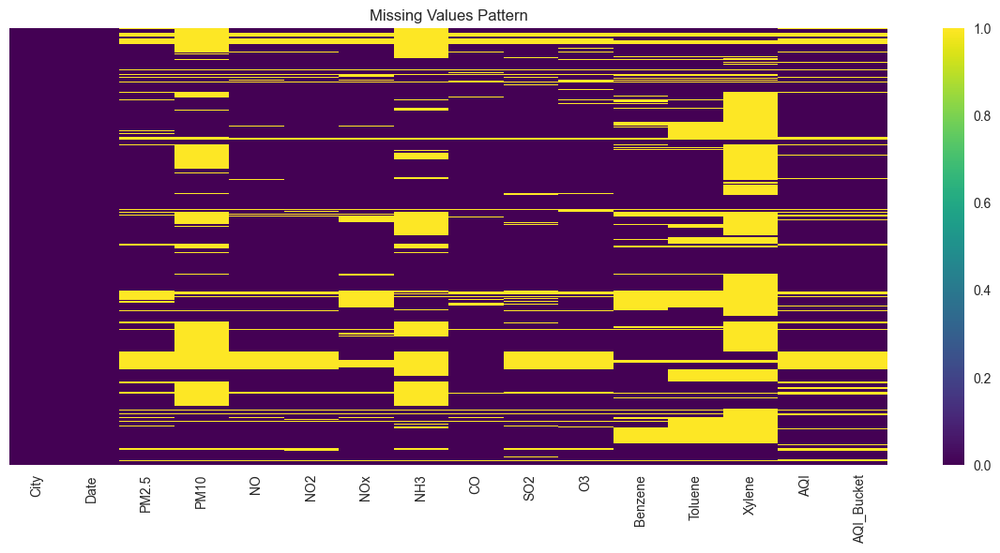


=== HANDLING MISSING VALUES ===
Missing values after cleaning:
City              0
Date              0
PM2.5             0
PM10           2009
NO             3582
NO2               0
NOx            4185
NH3           10328
CO                0
SO2               0
O3              162
Benzene        5623
Toluene        8041
Xylene        18109
AQI            4681
AQI_Bucket     4681
dtype: int64


In [8]:
# Missing Values Analysis and Handling
print("=== MISSING VALUES ANALYSIS ===")
missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100

missing_summary = pd.DataFrame({
    'Missing Count': missing_values,
    'Missing Percentage': missing_percentage
}).round(2)

print("Missing Values Summary:")
display(missing_summary[missing_summary['Missing Count'] > 0])

# Visualize missing values pattern
if missing_values.sum() > 0:
    plt.figure(figsize=(12, 6))
    sns.heatmap(df.isnull(), cbar=True, yticklabels=False, cmap='viridis')
    plt.title('Missing Values Pattern')
    plt.tight_layout()
    plt.show()
    
    # Handle missing values
    print("\n=== HANDLING MISSING VALUES ===")
    pollutant_cols = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3']
    
    # Strategy: Forward fill for time series data, then backward fill
    df_cleaned = df.copy()
    df_cleaned['Date'] = pd.to_datetime(df_cleaned['Date'])
    df_cleaned = df_cleaned.sort_values(['City', 'Date'])
    
    for col in pollutant_cols:
        if col in df_cleaned.columns:
            # Forward fill within each city group
            df_cleaned[col] = df_cleaned.groupby('City')[col].fillna(method='ffill')
            # Backward fill for remaining NaN values
            df_cleaned[col] = df_cleaned.groupby('City')[col].fillna(method='bfill')
            # If still NaN, fill with city median
            df_cleaned[col] = df_cleaned.groupby('City')[col].fillna(
                df_cleaned.groupby('City')[col].transform('median')
            )
    
    print("Missing values after cleaning:")
    print(df_cleaned.isnull().sum())
    df = df_cleaned.copy()
else:
    df['Date'] = pd.to_datetime(df['Date'])
    print("No missing values found in the dataset!")

In [9]:
# Descriptive Statistics Analysis
print("=== COMPREHENSIVE DESCRIPTIVE STATISTICS ===")
pollutant_cols = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3']
available_pollutants = [col for col in pollutant_cols if col in df.columns]

print("Overall Statistics:")
display(df[available_pollutants].describe().round(2))

print("\n=== STATISTICS BY CITY ===")
city_stats = df.groupby('City')[available_pollutants].agg(['mean', 'median', 'std', 'min', 'max']).round(2)
display(city_stats)

# Additional statistical measures
print("\n=== ADDITIONAL STATISTICAL MEASURES ===")
additional_stats = pd.DataFrame()
for col in available_pollutants:
    additional_stats[col] = [
        df[col].skew(),  # Skewness
        df[col].kurtosis(),  # Kurtosis
        df[col].quantile(0.25),  # Q1
        df[col].quantile(0.75),  # Q3
        df[col].quantile(0.75) - df[col].quantile(0.25),  # IQR
        df[col].std() / df[col].mean() if df[col].mean() != 0 else 0  # Coefficient of Variation
    ]

additional_stats.index = ['Skewness', 'Kurtosis', 'Q1', 'Q3', 'IQR', 'CV']
display(additional_stats.round(3))

=== COMPREHENSIVE DESCRIPTIVE STATISTICS ===
Overall Statistics:


,PM2.5,PM10,NO2,SO2,CO,O3
count,29531.00,27522.00,29531.00,29531.00,29531.00,29369.00
mean,72.19,122.20,26.69,22.53,2.29,33.45
std,76.19,94.32,23.81,39.07,6.82,21.92
min,0.04,0.01,0.01,0.01,0.00,0.01
25%,27.03,57.17,10.45,5.76,0.50,17.24
50%,48.00,97.15,19.71,9.67,0.91,29.54
75%,86.97,158.08,35.03,18.17,1.49,44.31
max,949.99,1000.00,362.21,193.86,175.81,257.73



=== STATISTICS BY CITY ===


PM2.5                                   PM10          \
                      mean  median     std    min     max    mean  median   
City                                                                        
Ahmedabad            92.98   79.34   53.34   3.04  381.69  136.12  141.54   
Aizawl               16.85   10.42   15.29   0.16   54.90   23.20   18.90   
Amaravati            36.28   26.12   27.06   4.65  139.38   73.64   62.23   
Amritsar             53.37   42.96   54.93   2.85  868.66  117.48   99.16   
Bengaluru            35.15   30.65   21.54   1.72  313.59   80.88   70.46   
Bhopal               48.99   42.56   30.54   3.40  136.42  116.60  117.86   
Brajrajnagar         62.88   59.52   34.50   2.54  308.79  121.50  118.56   
Chandigarh           40.71   34.05   27.59   6.86  154.85   85.66   78.94   
Chennai              55.33   46.96   35.49   6.55  293.43   53.68   48.55   
Coimbatore           29.15   28.58   11.08   2.13   63.10   37.82   35.96   
Delhi               117.10   94.49   82.93  10.24  685.36  233.95  219.94   
Ernakulam            24.83   19.76   14.97   3.48   78.27   48.18   44.64   
Gurugram            121.45   93.59  109.74   3.42  949.99  284.19  344.33   
Guwahati             63.86   46.89   61.70   5.39  916.67  116.60   87.98   
Hyderabad            46.66   43.08   37.60   4.83  571.02   90.49   93.00   
Jaipur               54.46   49.70   26.44   9.12  311.35  123.07  116.60   
Jorapokhar          143.51  217.13   82.13  10.04  217.13  149.14  121.14   
Kochi                31.43   24.28   20.05   5.97  143.85   67.34   45.66   
Kolkata              61.14   38.86   57.67   3.56  304.74  109.96   74.13   
Lucknow             133.48   89.04  145.27  11.39  742.67     NaN     NaN   
Mumbai               29.35   25.50   16.92   3.84  134.32   72.87   58.53   
Patna               120.75  100.96   86.69  10.78  645.50  154.86  158.08   
Shillong             28.14   17.42   74.83   2.03  917.77   38.90   25.58   
Talcher              61.40   44.86   50.12   0.04  354.44  165.79  124.50   
Thiruvananthapuram   27.64   22.06   17.74   2.00   98.87   52.19   47.26   
Visakhapatnam        44.55   36.70   26.91   2.00  203.05  102.96   94.72   

                                            ...     CO                      \
                       std    min      max  ...   mean median    std   min   
City                                        ...                              
Ahmedabad            23.39  11.50   586.27  ...  17.78   8.72  19.54  0.06   
Aizawl               16.96   1.15    62.86  ...   0.28   0.26   0.13  0.02   
Amaravati            44.10   7.80   230.27  ...   0.60   0.56   0.33  0.00   
Amritsar             74.44  10.81   917.08  ...   0.56   0.57   0.54  0.00   
Bengaluru            35.13   8.22   351.51  ...   1.84   0.92   3.96  0.00   
Bhopal               55.38  13.16   260.27  ...   0.86   0.85   0.38  0.15   
Brajrajnagar         74.03   3.97   589.39  ...   1.73   1.67   1.37  0.00   
Chandigarh           41.57  15.78   224.22  ...   0.63   0.60   0.22  0.20   
Chennai              28.65   0.21   346.73  ...   1.07   0.86   1.36  0.00   
Coimbatore           15.13   1.96   106.00  ...   0.95   0.88   0.49  0.05   
Delhi               120.04  18.59   796.88  ...   1.98   1.24   2.56  0.00   
Ernakulam            22.27  13.02   116.73  ...   1.63   1.54   0.42  1.04   
Gurugram            129.48  10.00   666.72  ...   1.24   0.77   2.71  0.00   
Guwahati            101.39  10.53  1000.00  ...   0.73   0.59   0.42  0.09   
Hyderabad            37.77  10.54   485.88  ...   0.59   0.57   0.51  0.00   
Jaipur               54.89   0.42   491.01  ...   0.80   0.77   0.39  0.00   
Jorapokhar          106.94   1.50   735.36  ...   0.63   0.36   0.64  0.00   
Kochi                46.64  10.97   256.55  ...   1.30   1.32   0.28  0.71   
Kolkata              91.80   7.12   469.32  ...   0.80   0.68   0.51  0.00   
Lucknow                NaN    NaN      NaN  ...   2.13   1.37   2.66  0


=== ADDITIONAL STATISTICAL MEASURES ===


,PM2.5,PM10,NO2,SO2,CO,O3
Skewness,3.958,1.924,2.562,3.457,9.040,1.454
Kurtosis,26.908,5.042,12.017,11.702,115.219,3.830
Q1,27.030,57.170,10.450,5.760,0.500,17.240
Q3,86.970,158.080,35.030,18.170,1.490,44.310
IQR,59.940,100.910,24.580,12.410,0.990,27.070
CV,1.055,0.772,0.892,1.734,2.976,0.655


=== CORRELATION ANALYSIS ===
Correlation Matrix:


,PM2.5,PM10,NO2,SO2,CO,O3
PM2.5,1.000,0.613,0.241,0.061,0.112,0.120
PM10,0.613,1.000,0.311,-0.032,0.072,0.172
NO2,0.241,0.311,1.000,0.019,0.354,0.305
SO2,0.061,-0.032,0.019,1.000,0.168,-0.055
CO,0.112,0.072,0.354,0.168,1.000,0.054
O3,0.120,0.172,0.305,-0.055,0.054,1.000


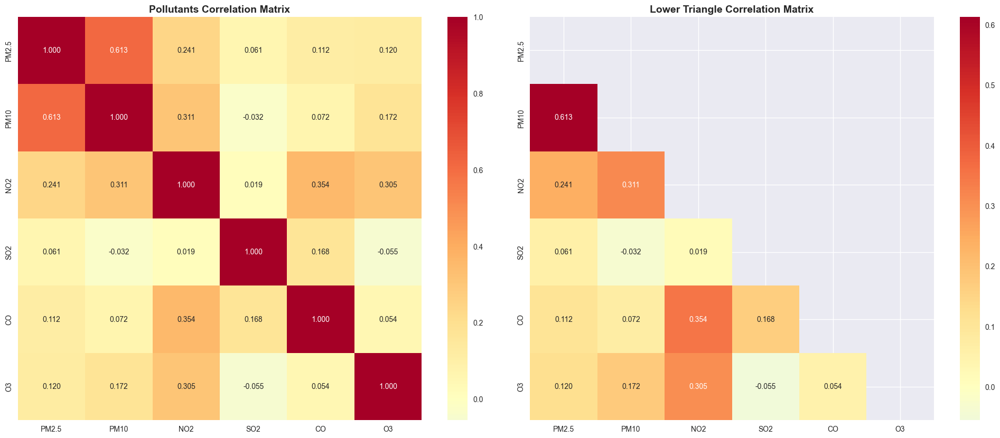

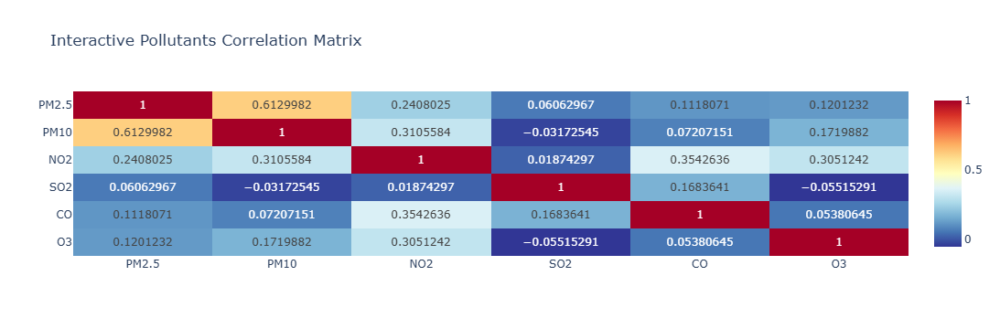


=== STRONGEST CORRELATIONS ===


,Pollutant 1,Pollutant 2,Correlation,Strength
0,PM2.5,PM10,0.613,Moderate
10,NO2,CO,0.354,Weak
5,PM10,NO2,0.311,Weak
11,NO2,O3,0.305,Weak
1,PM2.5,NO2,0.241,Weak
8,PM10,O3,0.172,Weak
12,SO2,CO,0.168,Weak
4,PM2.5,O3,0.120,Weak
3,PM2.5,CO,0.112,Weak
7,PM10,CO,0.072,Weak


In [10]:
# Correlation Analysis Between Pollutants
print("=== CORRELATION ANALYSIS ===")
correlation_matrix = df[available_pollutants].corr()

print("Correlation Matrix:")
display(correlation_matrix.round(3))

# Visualize correlation matrix with heatmap
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Matplotlib heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='RdYlBu_r', center=0,
            square=True, fmt='.3f', ax=axes[0])
axes[0].set_title('Pollutants Correlation Matrix', fontsize=14, fontweight='bold')

# Mask for upper triangle to show only lower triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap='RdYlBu_r', center=0,
            square=True, fmt='.3f', ax=axes[1])
axes[1].set_title('Lower Triangle Correlation Matrix', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

# Interactive correlation heatmap with Plotly
fig_interactive = px.imshow(correlation_matrix, 
                           text_auto=True, 
                           aspect="auto",
                           color_continuous_scale='RdYlBu_r',
                           title="Interactive Pollutants Correlation Matrix")
fig_interactive.show()

# Find strongest correlations
print("\n=== STRONGEST CORRELATIONS ===")
correlation_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        corr_val = correlation_matrix.iloc[i, j]
        correlation_pairs.append({
            'Pollutant 1': correlation_matrix.columns[i],
            'Pollutant 2': correlation_matrix.columns[j],
            'Correlation': corr_val,
            'Strength': 'Strong' if abs(corr_val) > 0.7 else 'Moderate' if abs(corr_val) > 0.5 else 'Weak'
        })

correlation_df = pd.DataFrame(correlation_pairs).sort_values('Correlation', key=abs, ascending=False)
display(correlation_df.round(3))

=== TEMPORAL POLLUTION TRENDS ANALYSIS ===


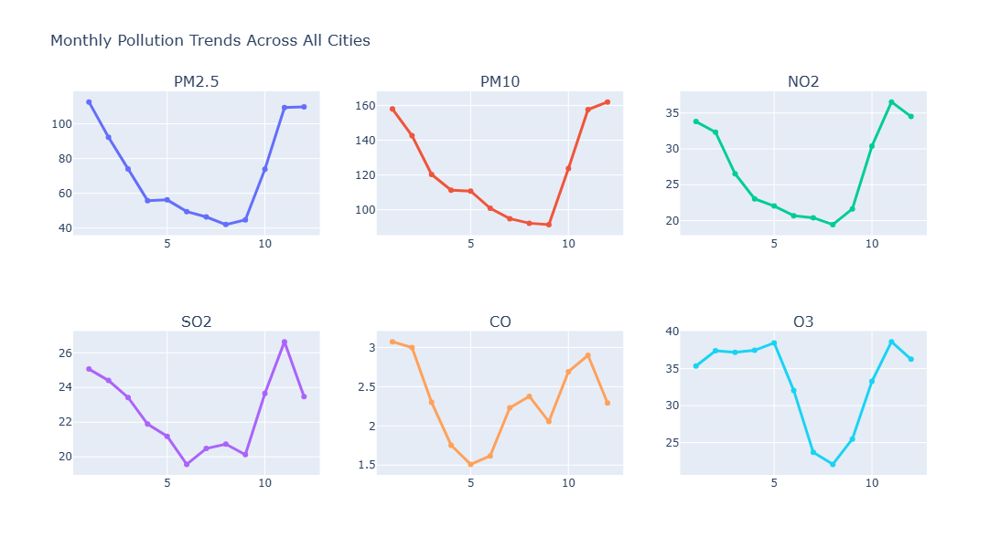


=== CITY-WISE TEMPORAL TRENDS ===


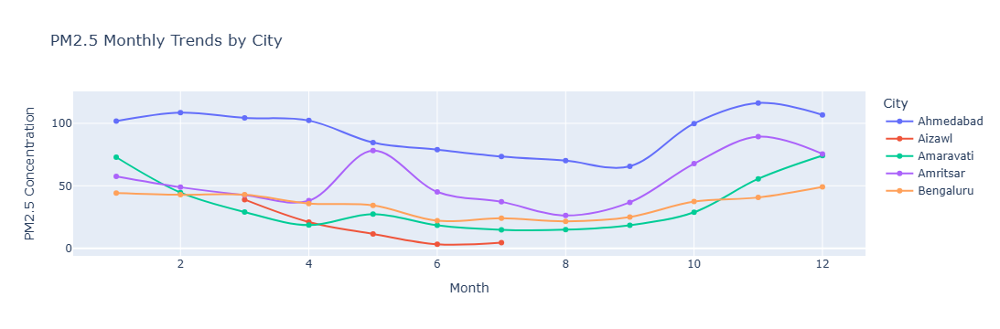

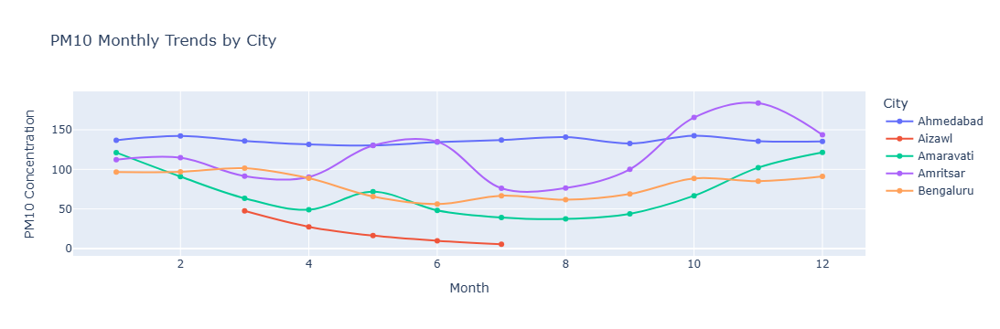

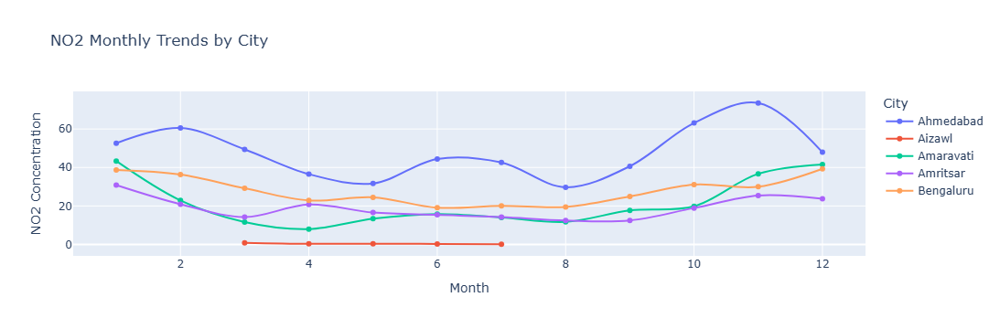

In [11]:
# Temporal Trends Analysis - Line Plots
print("=== TEMPORAL POLLUTION TRENDS ANALYSIS ===")

# Prepare data for time series analysis
df['Month'] = df['Date'].dt.month
df['Year'] = df['Date'].dt.year
df['Season'] = df['Month'].map({12: 'Winter', 1: 'Winter', 2: 'Winter',
                               3: 'Spring', 4: 'Spring', 5: 'Spring',
                               6: 'Summer', 7: 'Summer', 8: 'Summer',
                               9: 'Autumn', 10: 'Autumn', 11: 'Autumn'})

# Monthly trends for all cities combined
monthly_trends = df.groupby('Month')[available_pollutants].mean().reset_index()

# Interactive line plot for monthly trends
fig = make_subplots(rows=2, cols=3, 
                    subplot_titles=available_pollutants,
                    specs=[[{"secondary_y": False}]*3]*2)

row_col_mapping = [(1, 1), (1, 2), (1, 3), (2, 1), (2, 2), (2, 3)]

for i, pollutant in enumerate(available_pollutants):
    row, col = row_col_mapping[i]
    fig.add_trace(
        go.Scatter(x=monthly_trends['Month'], 
                  y=monthly_trends[pollutant],
                  mode='lines+markers',
                  name=pollutant,
                  line=dict(width=3)),
        row=row, col=col
    )

fig.update_layout(height=600, title_text="Monthly Pollution Trends Across All Cities", showlegend=False)
fig.show()

# City-wise temporal trends (Interactive)
print("\n=== CITY-WISE TEMPORAL TRENDS ===")
cities_to_plot = df['City'].unique()[:5]  # Top 5 cities for readability

for pollutant in available_pollutants[:3]:  # Show first 3 pollutants
    city_monthly = df[df['City'].isin(cities_to_plot)].groupby(['City', 'Month'])[pollutant].mean().reset_index()
    
    fig = px.line(city_monthly, x='Month', y=pollutant, color='City',
                  title=f'{pollutant} Monthly Trends by City',
                  markers=True, line_shape='spline')
    fig.update_layout(xaxis_title='Month', yaxis_title=f'{pollutant} Concentration')
    fig.show()

=== POLLUTANT DISTRIBUTION ANALYSIS ===


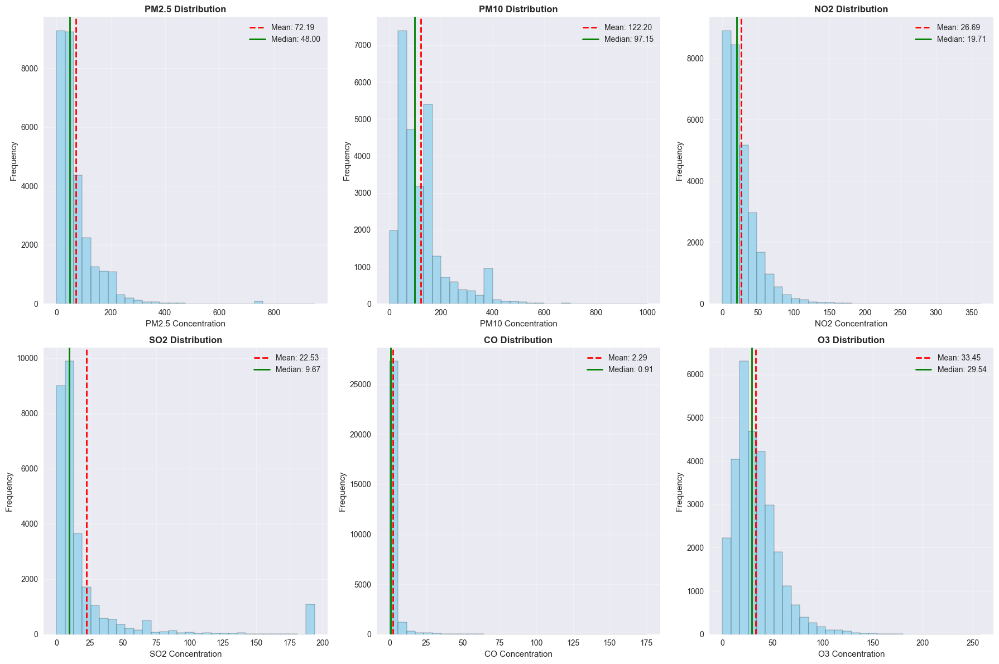


=== INTERACTIVE DISTRIBUTION PLOTS ===


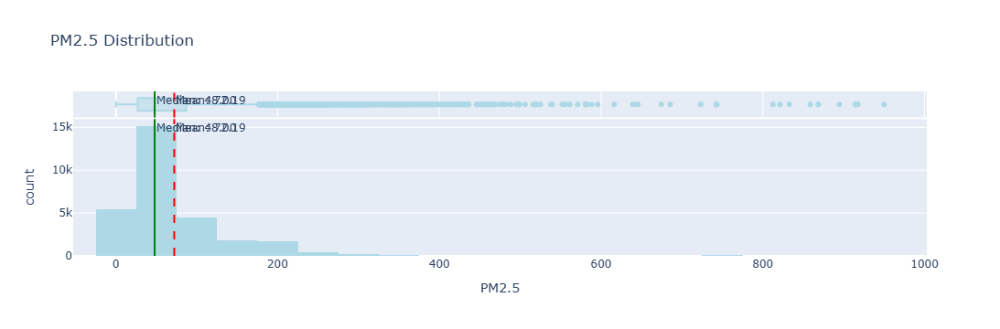

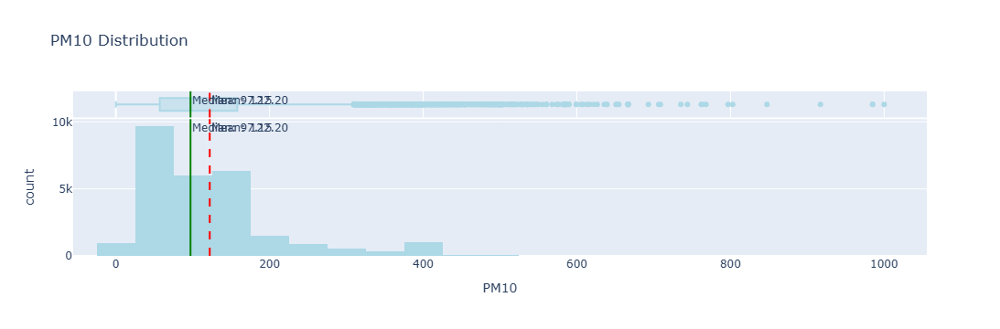

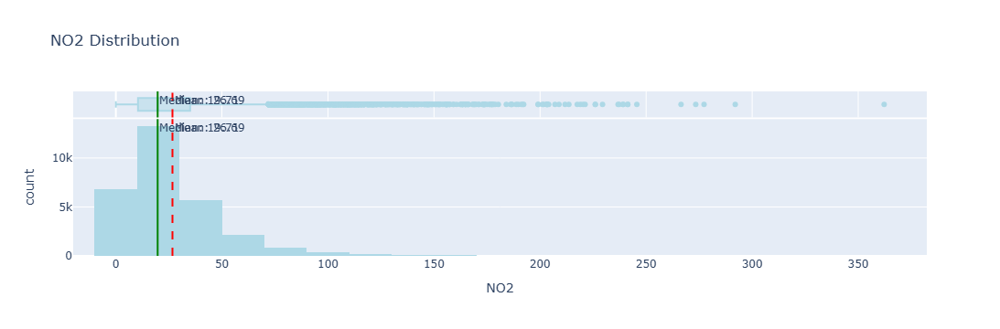


=== BOX PLOTS BY CITY ===


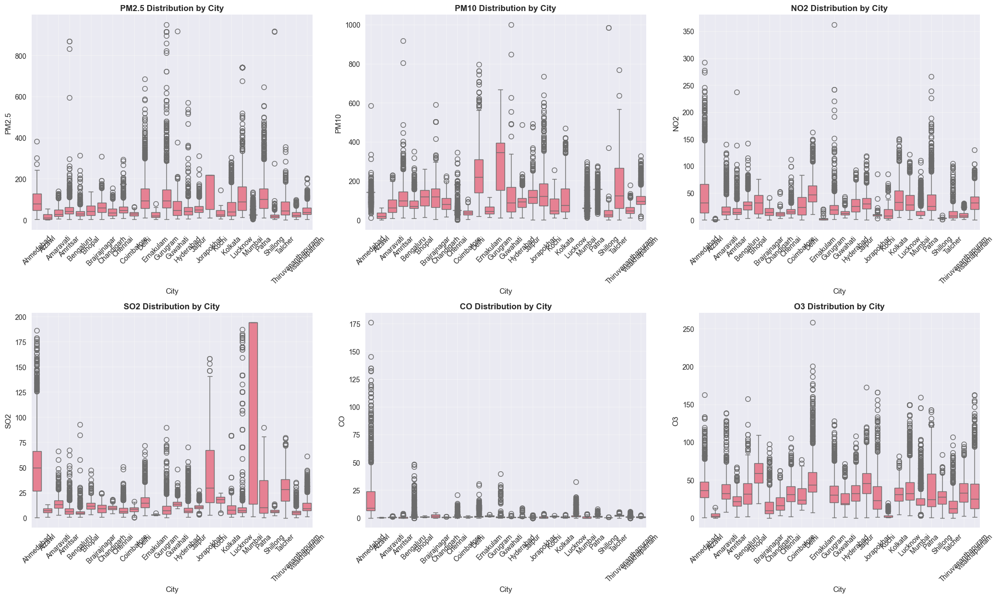

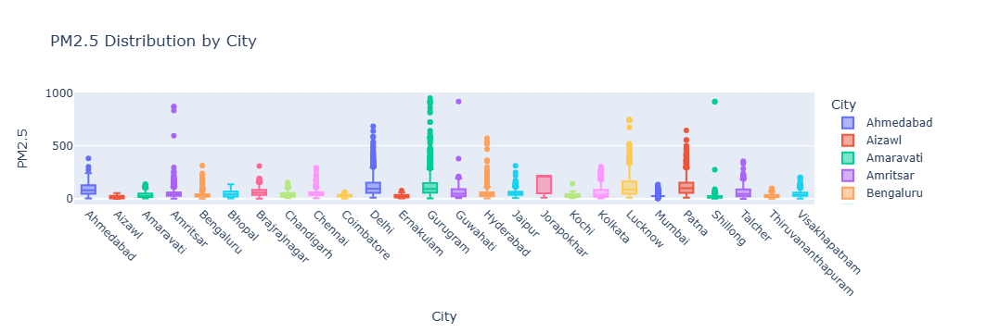

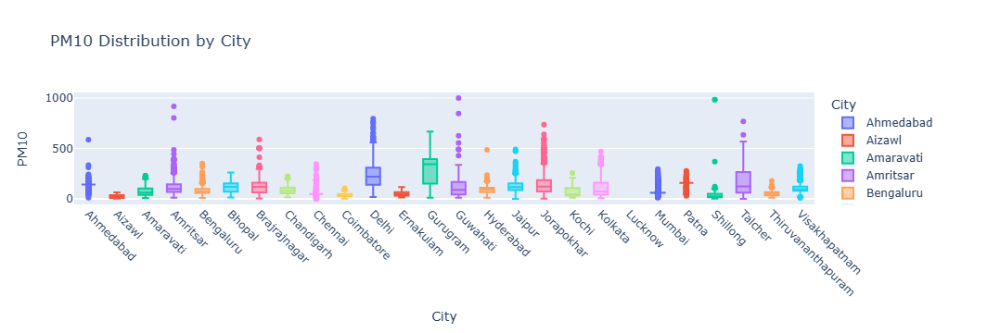

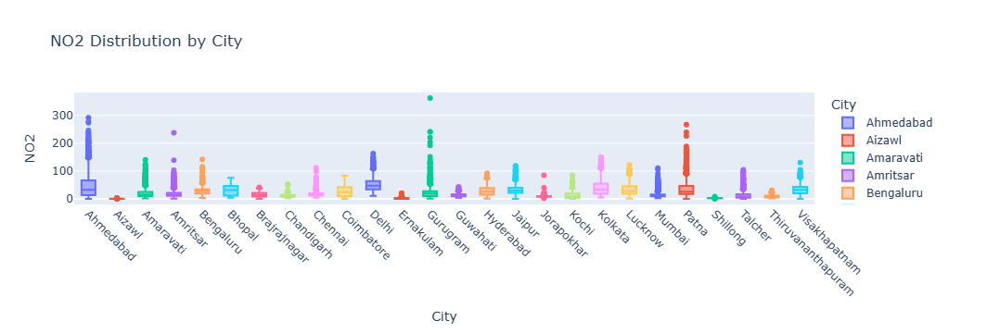

In [12]:
# Distribution Analysis - Histograms and Box Plots
print("=== POLLUTANT DISTRIBUTION ANALYSIS ===")

# Histograms for each pollutant
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.ravel()

for i, pollutant in enumerate(available_pollutants):
    # Histogram with KDE
    axes[i].hist(df[pollutant], bins=30, alpha=0.7, color='skyblue', edgecolor='black')
    axes[i].axvline(df[pollutant].mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {df[pollutant].mean():.2f}')
    axes[i].axvline(df[pollutant].median(), color='green', linestyle='-', linewidth=2, label=f'Median: {df[pollutant].median():.2f}')
    axes[i].set_title(f'{pollutant} Distribution', fontweight='bold')
    axes[i].set_xlabel(f'{pollutant} Concentration')
    axes[i].set_ylabel('Frequency')
    axes[i].legend()
    axes[i].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Interactive histograms with Plotly
print("\n=== INTERACTIVE DISTRIBUTION PLOTS ===")
for pollutant in available_pollutants[:3]:  # Show first 3 for space
    fig = px.histogram(df, x=pollutant, nbins=30, 
                      title=f'{pollutant} Distribution',
                      marginal='box',  # Add box plot on top
                      color_discrete_sequence=['lightblue'])
    fig.add_vline(x=df[pollutant].mean(), line_dash="dash", line_color="red", 
                  annotation_text=f"Mean: {df[pollutant].mean():.2f}")
    fig.add_vline(x=df[pollutant].median(), line_dash="solid", line_color="green",
                  annotation_text=f"Median: {df[pollutant].median():.2f}")
    fig.show()

# Box plots by city
print("\n=== BOX PLOTS BY CITY ===")
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.ravel()

for i, pollutant in enumerate(available_pollutants):
    sns.boxplot(data=df, x='City', y=pollutant, ax=axes[i])
    axes[i].set_title(f'{pollutant} Distribution by City', fontweight='bold')
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Interactive box plots
for pollutant in available_pollutants[:3]:
    fig = px.box(df, x='City', y=pollutant, 
                title=f'{pollutant} Distribution by City',
                color='City')
    fig.update_xaxes(tickangle=45)
    fig.show()

=== SEASONAL POLLUTION ANALYSIS ===
Top 5 most polluted cities: ['Jorapokhar', 'Lucknow', 'Gurugram', 'Patna', 'Delhi']

=== SEASONAL STATISTICS COMPARISON ===


PM2.5                  PM10                    NO2                \
          mean median    std    mean  median     std   mean median    std   
Season                                                                      
Autumn   76.12  50.55  74.08  124.41  100.02  100.69  29.56  22.10  27.48   
Spring   62.03  44.30  67.67  114.09   92.89   83.00  23.84  18.09  19.82   
Summer   46.32  31.42  52.95   96.42   70.46   82.05  20.21  15.46  18.24   
Winter  104.96  74.74  92.21  154.16  137.15  101.88  33.54  27.76  26.75   

          SO2                  CO                  O3                
         mean median    std  mean median   std   mean median    std  
Season                                                               
Autumn  23.49   9.85  41.21  2.55   0.95  8.26  32.51  27.49  22.62  
Spring  22.16   9.79  37.71  1.85   0.83  4.67  37.74  35.00  21.98  
Summer  20.20   8.52  38.37  2.03   0.75  5.72  26.45  21.64  18.22  
Winter  24.34  11.00  39.15  2.80   1.09  8.22  36.33  33.46  22.72

PM2.5    PM10    NO2    SO2    CO     O3
City       Season                                           
Delhi      Autumn  144.79  258.97  56.25  15.48  1.46  55.01
           Spring   90.23  215.37  48.40  19.68  2.33  53.58
           Summer   53.86  161.27  39.07  12.32  1.12  45.92
           Winter  182.24  301.58  59.69  16.13  2.87  48.80
Gurugram   Autumn  123.96  301.00  24.53   8.33  1.01  29.66
           Spring  118.05  260.76  23.27  11.28  0.81  43.63
           Summer   94.28  256.05  16.48   7.12  0.54  34.14
           Winter  146.86  319.21  26.24   9.83  2.50  24.97
Jorapokhar Autumn  163.69  146.47   7.87  40.71  0.45  28.20
           Spring  121.69  126.14   9.30  44.55  0.78  34.83
           Summer  144.69  115.82   9.16  30.61  0.77  18.45
           Winter  147.46  216.59   9.59  53.76  0.46  38.43
Lucknow    Autumn  126.86     NaN  39.74   7.32  2.11  33.88
           Spring  111.42     NaN  32.87  11.18  1.62  49.08
           Summer   52.27     NaN  20.77   6.63  1.73  28.27
           Winter  241.21     NaN  39.66  22.35  3.07  37.93
Patna      Autumn  132.36  158.08  40.24  20.82  1.45  43.80
           Spring   82.49  149.31  30.38  21.57  1.17  46.56
           Summer   67.41  152.02  32.17  18.94  1.06  32.26
           Winter  205.94  160.35  41.74  19.75  2.09  33.27


=== INTERACTIVE SEASONAL COMPARISON ===


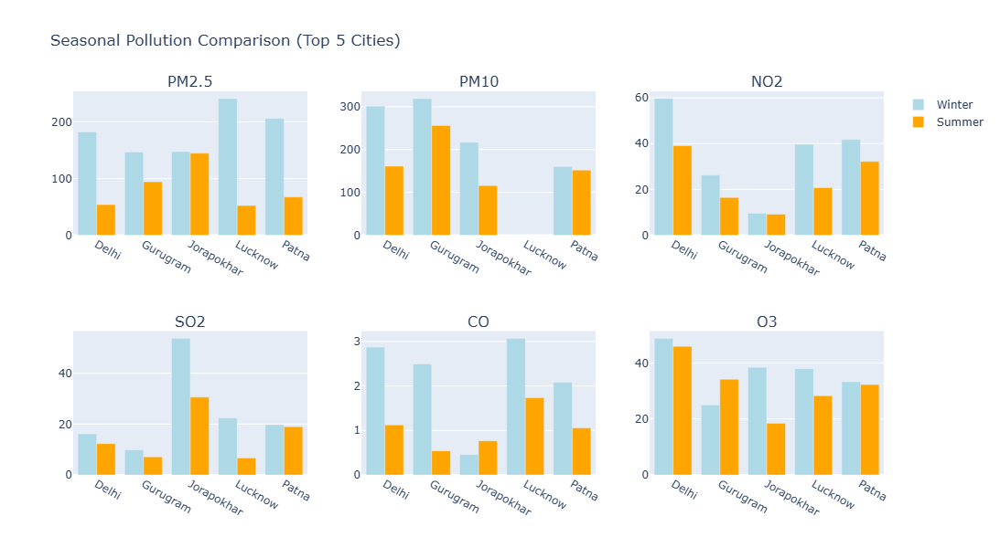

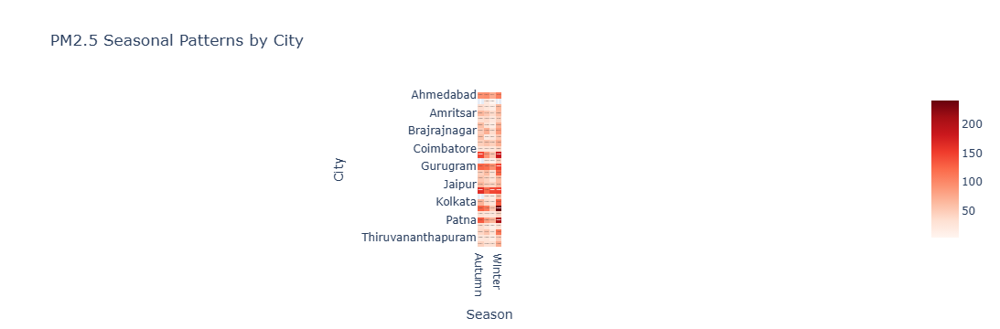

In [13]:
# Seasonal Analysis - Winter vs Summer Comparison
print("=== SEASONAL POLLUTION ANALYSIS ===")

# Identify top 5 most polluted cities based on PM2.5
top_polluted_cities = df.groupby('City')['PM2.5'].mean().sort_values(ascending=False).head(5).index.tolist()
print(f"Top 5 most polluted cities: {top_polluted_cities}")

# Filter data for winter and summer seasons
seasonal_data = df[df['City'].isin(top_polluted_cities)]
winter_data = seasonal_data[seasonal_data['Season'] == 'Winter']
summer_data = seasonal_data[seasonal_data['Season'] == 'Summer']

# Seasonal comparison statistics
print("\n=== SEASONAL STATISTICS COMPARISON ===")
seasonal_stats = df.groupby(['Season'])[available_pollutants].agg(['mean', 'median', 'std']).round(2)
display(seasonal_stats)

# Seasonal comparison for top cities
seasonal_city_comparison = df[df['City'].isin(top_polluted_cities)].groupby(['City', 'Season'])[available_pollutants].mean().round(2)
display(seasonal_city_comparison)

# Interactive seasonal comparison plots
print("\n=== INTERACTIVE SEASONAL COMPARISON ===")

# Create subplot for seasonal comparison
fig = make_subplots(rows=2, cols=3, 
                    subplot_titles=available_pollutants,
                    specs=[[{"secondary_y": False}]*3]*2)

row_col_mapping = [(1, 1), (1, 2), (1, 3), (2, 1), (2, 2), (2, 3)]

for i, pollutant in enumerate(available_pollutants):
    row, col = row_col_mapping[i]
    
    seasonal_comparison = df[df['City'].isin(top_polluted_cities)].groupby(['City', 'Season'])[pollutant].mean().reset_index()
    
    winter_vals = seasonal_comparison[seasonal_comparison['Season'] == 'Winter']
    summer_vals = seasonal_comparison[seasonal_comparison['Season'] == 'Summer']
    
    fig.add_trace(go.Bar(x=winter_vals['City'], y=winter_vals[pollutant], 
                        name='Winter', marker_color='lightblue', showlegend=(i==0)),
                  row=row, col=col)
    fig.add_trace(go.Bar(x=summer_vals['City'], y=summer_vals[pollutant], 
                        name='Summer', marker_color='orange', showlegend=(i==0)),
                  row=row, col=col)

fig.update_layout(height=600, title_text="Seasonal Pollution Comparison (Top 5 Cities)", 
                 barmode='group')
fig.show()

# Heatmap for seasonal patterns
seasonal_heatmap_data = df.groupby(['City', 'Season'])['PM2.5'].mean().unstack()
fig = px.imshow(seasonal_heatmap_data, 
                title="PM2.5 Seasonal Patterns by City",
                color_continuous_scale='Reds',
                text_auto=True)
fig.show()

=== ANOMALY DETECTION AND OUTLIER ANALYSIS ===


,Pollutant,Total_Outliers,Outlier_Percentage,Lower_Bound,Upper_Bound,Max_Outlier,Min_Outlier
0,PM2.5,2293,7.76,-62.88,176.88,949.99,176.96
1,PM10,1795,6.08,-94.20,309.45,1000.00,309.47
2,NO2,1426,4.83,-26.42,71.90,362.21,71.91
3,SO2,3858,13.06,-12.86,36.79,193.86,36.80
4,CO,3008,10.19,-0.98,2.97,175.81,2.98
5,O3,858,2.91,-23.37,84.92,257.73,84.94



=== OUTLIER VISUALIZATION ===


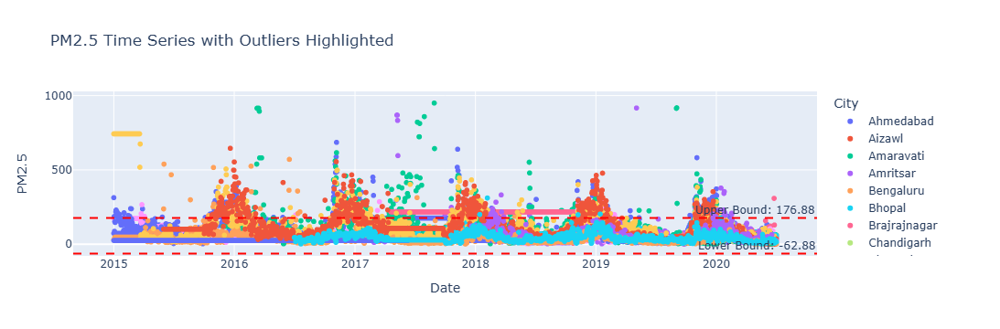

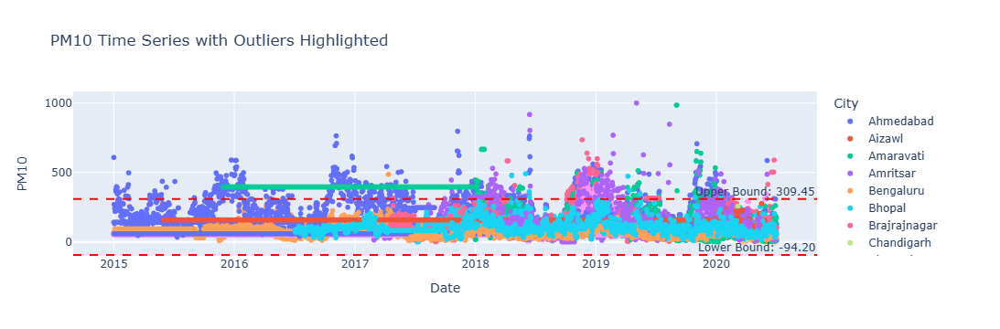

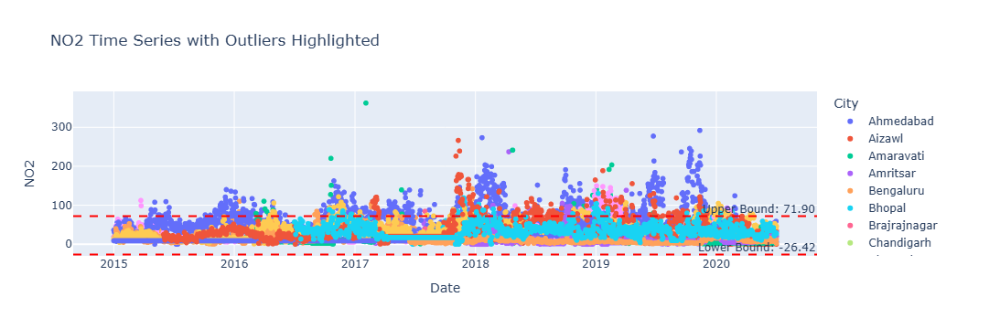


=== CITY-WISE OUTLIER ANALYSIS ===


,City,Total_Outliers,Outlier_Percentage
20,Mumbai,2171,18.01
8,Chennai,879,7.29
0,Ahmedabad,803,6.66
4,Bengaluru,569,4.72
19,Lucknow,547,4.54
21,Patna,506,4.54
10,Delhi,499,4.14
12,Gurugram,402,3.99
25,Visakhapatnam,388,4.42
3,Amritsar,354,4.83


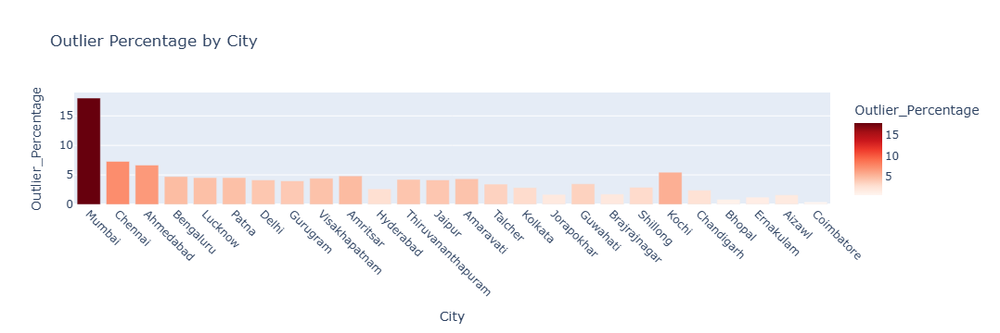

In [14]:
# Anomaly Detection and Outlier Analysis
print("=== ANOMALY DETECTION AND OUTLIER ANALYSIS ===")

def detect_outliers_iqr(data, column):
    """Detect outliers using IQR method"""
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers, lower_bound, upper_bound

# Detect outliers for each pollutant
outlier_summary = []
for pollutant in available_pollutants:
    outliers, lower, upper = detect_outliers_iqr(df, pollutant)
    outlier_summary.append({
        'Pollutant': pollutant,
        'Total_Outliers': len(outliers),
        'Outlier_Percentage': (len(outliers) / len(df)) * 100,
        'Lower_Bound': lower,
        'Upper_Bound': upper,
        'Max_Outlier': outliers[pollutant].max() if len(outliers) > 0 else 'None',
        'Min_Outlier': outliers[pollutant].min() if len(outliers) > 0 else 'None'
    })

outlier_df = pd.DataFrame(outlier_summary)
display(outlier_df.round(2))

# Visualize outliers with interactive scatter plots
print("\n=== OUTLIER VISUALIZATION ===")
for pollutant in available_pollutants[:3]:
    outliers, lower, upper = detect_outliers_iqr(df, pollutant)
    
    fig = px.scatter(df, x='Date', y=pollutant, color='City',
                    title=f'{pollutant} Time Series with Outliers Highlighted',
                    hover_data=['City'])
    
    # Add horizontal lines for outlier bounds
    fig.add_hline(y=upper, line_dash="dash", line_color="red", 
                  annotation_text=f"Upper Bound: {upper:.2f}")
    fig.add_hline(y=lower, line_dash="dash", line_color="red",
                  annotation_text=f"Lower Bound: {lower:.2f}")
    
    fig.show()

# City-wise outlier analysis
print("\n=== CITY-WISE OUTLIER ANALYSIS ===")
city_outlier_summary = []
for city in df['City'].unique():
    city_data = df[df['City'] == city]
    city_outliers = 0
    
    for pollutant in available_pollutants:
        outliers, _, _ = detect_outliers_iqr(city_data, pollutant)
        city_outliers += len(outliers)
    
    city_outlier_summary.append({
        'City': city,
        'Total_Outliers': city_outliers,
        'Outlier_Percentage': (city_outliers / (len(city_data) * len(available_pollutants))) * 100
    })

city_outlier_df = pd.DataFrame(city_outlier_summary).sort_values('Total_Outliers', ascending=False)
display(city_outlier_df.round(2))

# Interactive outlier percentage by city
fig = px.bar(city_outlier_df, x='City', y='Outlier_Percentage',
            title='Outlier Percentage by City',
            color='Outlier_Percentage',
            color_continuous_scale='Reds')
fig.update_xaxes(tickangle=45)
fig.show()

In [15]:
# Comprehensive EDA Insights and Conclusions
print("=== COMPREHENSIVE EDA INSIGHTS AND CONCLUSIONS ===")

# Summary statistics for final insights
print("📊 DATASET SUMMARY:")
print(f"• Total observations: {len(df):,}")
print(f"• Cities analyzed: {df['City'].nunique()}")
print(f"• Date range: {df['Date'].min().strftime('%Y-%m-%d')} to {df['Date'].max().strftime('%Y-%m-%d')}")
print(f"• Pollutants measured: {len(available_pollutants)}")

print("\n🏭 POLLUTION LEVEL INSIGHTS:")
for pollutant in available_pollutants:
    mean_val = df[pollutant].mean()
    std_val = df[pollutant].std()
    cv = std_val / mean_val if mean_val != 0 else 0
    print(f"• {pollutant}: Mean = {mean_val:.2f}, CV = {cv:.2f} ({'High' if cv > 0.5 else 'Moderate' if cv > 0.3 else 'Low'} variability)")

print("\n🏙️ CITY-WISE INSIGHTS:")
city_pollution_rank = df.groupby('City')[available_pollutants].mean().mean(axis=1).sort_values(ascending=False)
print("Most polluted cities (based on average pollutant levels):")
for i, (city, pollution_level) in enumerate(city_pollution_rank.head(3).items(), 1):
    print(f"{i}. {city}: {pollution_level:.2f}")

print("\n📈 TEMPORAL PATTERNS:")
seasonal_means = df.groupby('Season')[available_pollutants].mean().mean(axis=1).sort_values(ascending=False)
print("Pollution levels by season:")
for season, level in seasonal_means.items():
    print(f"• {season}: {level:.2f}")

print("\n🔗 CORRELATION INSIGHTS:")
strong_correlations = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        corr_val = correlation_matrix.iloc[i, j]
        if abs(corr_val) > 0.7:
            strong_correlations.append((correlation_matrix.columns[i], correlation_matrix.columns[j], corr_val))

if strong_correlations:
    print("Strong correlations found:")
    for pol1, pol2, corr in strong_correlations:
        print(f"• {pol1} ↔ {pol2}: {corr:.3f}")
else:
    print("• No strong correlations (>0.7) found between pollutants")

print("\n⚠️ DATA QUALITY ASSESSMENT:")
print(f"• Missing values handled: {'Yes' if missing_values.sum() > 0 else 'No missing values found'}")
print(f"• Outliers detected: {outlier_df['Total_Outliers'].sum()} total outliers")
print(f"• Data completeness: {((len(df) * len(available_pollutants) - missing_values.sum()) / (len(df) * len(available_pollutants))) * 100:.1f}%")

print("\n🎯 KEY RECOMMENDATIONS:")
print("1. 🔍 Data Collection: Focus on winter months for pollution monitoring")
print("2. 🏙️ City Planning: Prioritize pollution control in", ", ".join(city_pollution_rank.head(2).index))
print("3. 📊 Analysis: Strong correlations suggest common pollution sources")
print("4. 🚨 Monitoring: Implement outlier detection systems for real-time alerts")
print("5. 🌱 Policy: Seasonal pollution control measures needed for winter months")

print("\n✅ EDA COMPLETION STATUS:")
print("✓ Dataset structure analyzed")
print("✓ Missing values handled")
print("✓ Descriptive statistics computed")
print("✓ Correlation analysis completed")
print("✓ Temporal trends identified")
print("✓ Distribution patterns analyzed")
print("✓ Seasonal patterns compared")
print("✓ Outliers and anomalies detected")
print("✓ Interactive visualizations created")
print("✓ Comprehensive insights documented")

print("\n🚀 READY FOR NEXT STEPS:")
print("• Machine learning model development")
print("• Predictive analysis implementation")
print("• Real-time monitoring system design")
print("• Policy recommendation framework")

=== COMPREHENSIVE EDA INSIGHTS AND CONCLUSIONS ===
📊 DATASET SUMMARY:
• Total observations: 29,531
• Cities analyzed: 26
• Date range: 2015-01-01 to 2020-07-01
• Pollutants measured: 6

🏭 POLLUTION LEVEL INSIGHTS:
• PM2.5: Mean = 72.19, CV = 1.06 (High variability)
• PM10: Mean = 122.20, CV = 0.77 (High variability)
• NO2: Mean = 26.69, CV = 0.89 (High variability)
• SO2: Mean = 22.53, CV = 1.73 (High variability)
• CO: Mean = 2.29, CV = 2.98 (High variability)
• O3: Mean = 33.45, CV = 0.66 (High variability)

🏙️ CITY-WISE INSIGHTS:
Most polluted cities (based on average pollutant levels):
1. Gurugram: 78.69
2. Delhi: 78.44
3. Ahmedabad: 64.42

📈 TEMPORAL PATTERNS:
Pollution levels by season:
• Winter: 59.36
• Autumn: 48.11
• Spring: 43.62
• Summer: 35.27

🔗 CORRELATION INSIGHTS:
• No strong correlations (>0.7) found between pollutants

⚠️ DATA QUALITY ASSESSMENT:
• Missing values handled: Yes
• Outliers detected: 13238 total outliers
• Data completeness: 50.1%

🎯 KEY RECOMMENDATIONS:
